In [1]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import glob as gb
import cv2
from tqdm import tqdm

In [2]:
data_dir = '/kaggle/input/new-plant-diseases-dataset/'
train_dir = os.path.join(data_dir, 'New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/')
val_dir = os.path.join(train_dir, '../valid/')
test_dir = os.path.join(data_dir, 'test/test/')  # Ensure images are directly here

In [3]:
classes = os.listdir(train_dir)
num_of_classes = len(classes)
num_of_classes

38

In [4]:
size=224
train_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255.0,
    rotation_range=50,
    zoom_range=0.2,
    preprocessing_function=None,
).flow_from_directory(train_dir,
                      batch_size=64,
                      target_size=(size, size),
                      class_mode='categorical',
                      shuffle=True)




# Validation generator pointing to a unique directory
valid_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255.0,
    rotation_range=50,
    zoom_range=0.2,
    preprocessing_function=None,
).flow_from_directory(val_dir,  # Use the path to your unique validation directory
                      batch_size=64,
                      target_size=(size, size),
                      color_mode='rgb',
                      class_mode='categorical',
                      shuffle=False)

Found 70295 images belonging to 38 classes.
Found 17572 images belonging to 38 classes.


In [5]:
train_generator.class_indices

{'Apple___Apple_scab': 0,
 'Apple___Black_rot': 1,
 'Apple___Cedar_apple_rust': 2,
 'Apple___healthy': 3,
 'Blueberry___healthy': 4,
 'Cherry_(including_sour)___Powdery_mildew': 5,
 'Cherry_(including_sour)___healthy': 6,
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot': 7,
 'Corn_(maize)___Common_rust_': 8,
 'Corn_(maize)___Northern_Leaf_Blight': 9,
 'Corn_(maize)___healthy': 10,
 'Grape___Black_rot': 11,
 'Grape___Esca_(Black_Measles)': 12,
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 13,
 'Grape___healthy': 14,
 'Orange___Haunglongbing_(Citrus_greening)': 15,
 'Peach___Bacterial_spot': 16,
 'Peach___healthy': 17,
 'Pepper,_bell___Bacterial_spot': 18,
 'Pepper,_bell___healthy': 19,
 'Potato___Early_blight': 20,
 'Potato___Late_blight': 21,
 'Potato___healthy': 22,
 'Raspberry___healthy': 23,
 'Soybean___healthy': 24,
 'Squash___Powdery_mildew': 25,
 'Strawberry___Leaf_scorch': 26,
 'Strawberry___healthy': 27,
 'Tomato___Bacterial_spot': 28,
 'Tomato___Early_blight': 29,
 'Toma

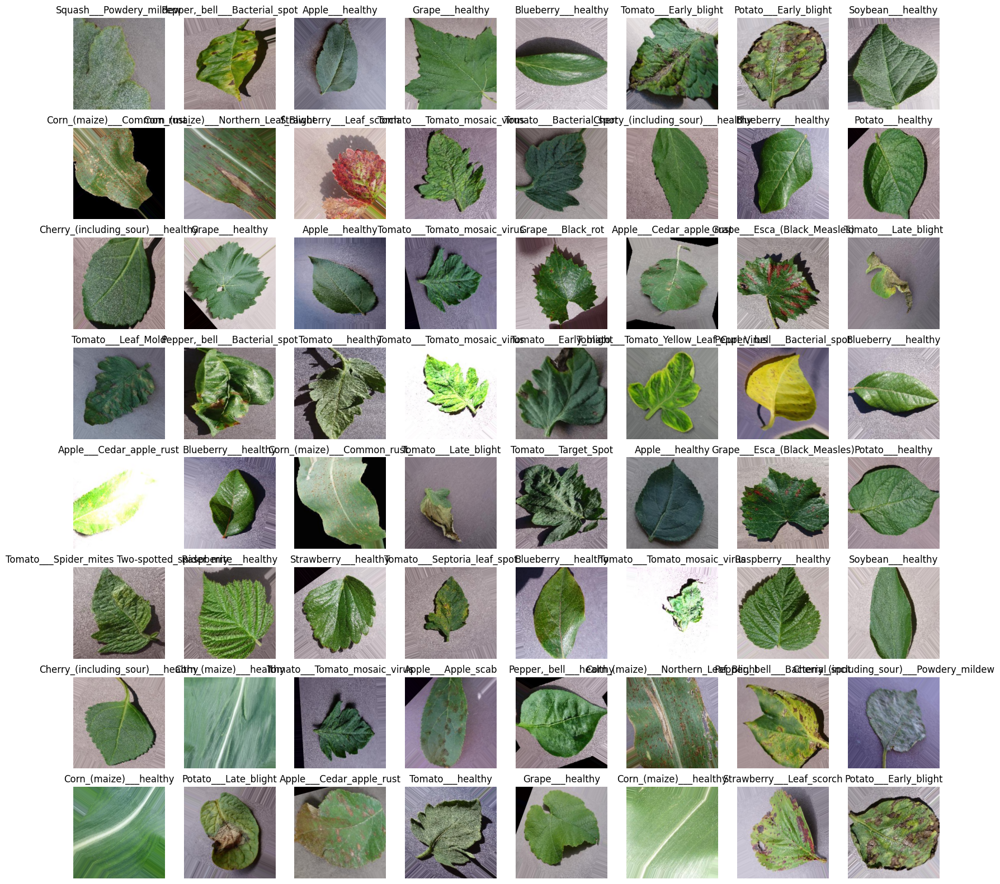

In [6]:
classes=list(train_generator.class_indices.keys())
plt.figure(figsize=(20,20))
for x_batch,y_batch in train_generator:
    for i in range(64):
        plt.subplot(8,8,i+1)
        plt.imshow(x_batch[i])
        plt.title(classes[np.where(y_batch[i]==1)[0][0]])
        plt.axis('off')
    plt.show()
    break


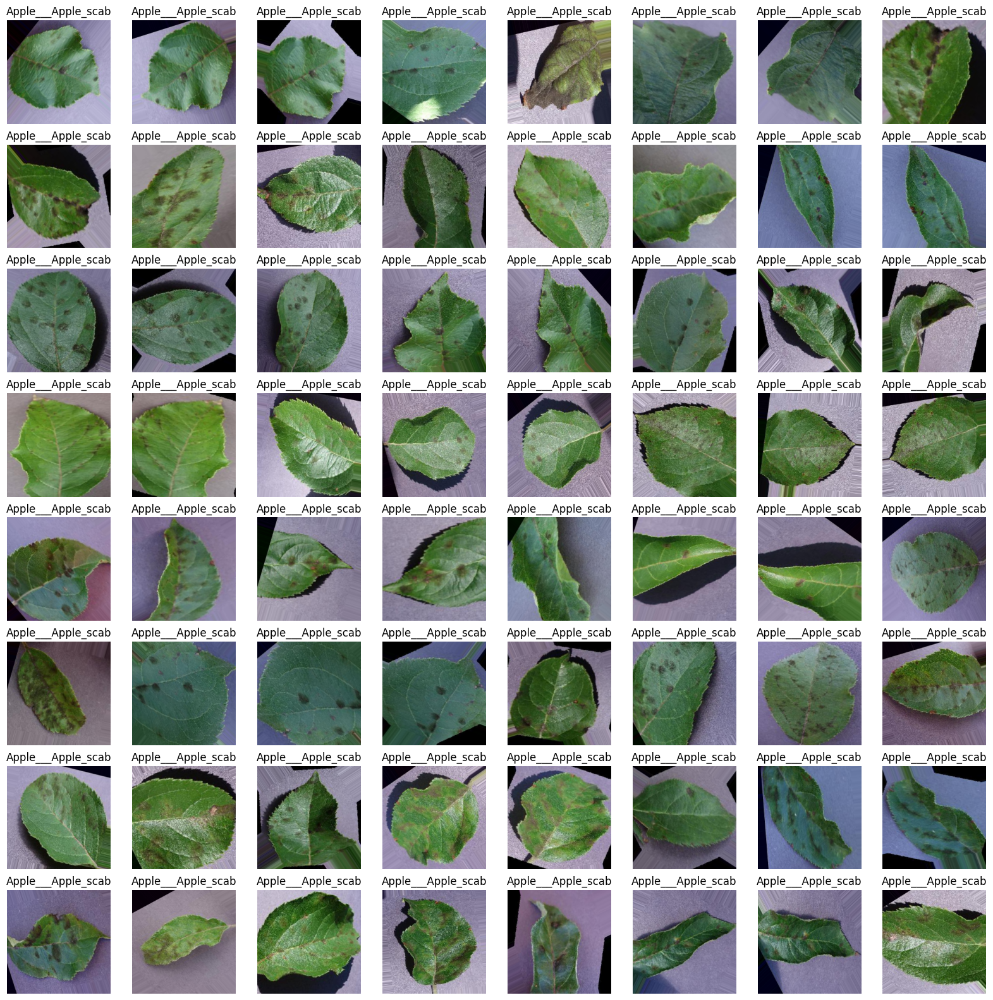

In [7]:
classes=list(valid_generator.class_indices.keys())
plt.figure(figsize=(20,20))
for x_batch,y_batch in valid_generator:
    for i in range(64):
        plt.subplot(8,8,i+1)
        plt.imshow(x_batch[i])
        plt.title(classes[np.where(y_batch[i]==1)[0][0]])
        plt.axis('off')
    plt.show()
    break


In [8]:
input_shape = (size, size, 3)  # Adjust height, width, and channels as needed


# Define inputs
inputs = tf.keras.Input(shape=input_shape)
# print(inputs )
# model_name='VGG19'
# Load the base model
base_model = keras.applications.NASNetLarge(include_top=False, weights='imagenet', input_tensor=inputs)
# Freeze the base model layers
base_model.trainable = False

x = tf.keras.layers.Flatten()(base_model.output)

x = tf.keras.layers.GlobalAveragePooling2D()(base_model.output)
x = tf.keras.layers.Dense(1024, activation='relu')(x)
x = tf.keras.layers.Dense(512, activation='relu')(x)
x = tf.keras.layers.BatchNormalization()(x)
x = tf.keras.layers.Dropout(0.2)(x)
# x = tf.keras.layers.Dense(64, activation='relu')(x)
# x = tf.keras.layers.BatchNormalization()(x)
# x = tf.keras.layers.Dropout(0.5)(x)
outputs = tf.keras.layers.Dense(38, activation='softmax')(x)

# Create model
model = tf.keras.models.Model(inputs = inputs, outputs = outputs)

343610240/343610240 ━━━━━━━━━━━━━━━━━━━━ 9s 0us/step


In [9]:
model.compile(loss="categorical_crossentropy", 
              optimizer= keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999),
              metrics=["accuracy",'precision','recall'])

In [10]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv1 (Conv2D) │ (None, 111, 111,  │      2,592 │ input_layer[0][0] │
│                     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn1            │ (None, 111, 111,  │        384 │ stem_conv1[0][0]  │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 111, 111,  │          0 │ stem_bn1[0][0]    │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reduction_conv_1_s… │ (None, 111, 111,  │      4,032 │ activation[0][0]  │
│ (Conv2D)            │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reduction_bn_1_ste… │ (None, 111, 111,  │        168 │ reduction_conv_1… │
│ (BatchNormalizatio… │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 111, 111,  │          0 │ reduction_bn_1_s… │
│ (Activation)        │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 111, 111,  │          0 │ stem_bn1[0][0]    │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv_1_p… │ (None, 115, 115,  │          0 │ activation_1[0][… │
│ (ZeroPadding2D)     │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv_1_p… │ (None, 117, 117,  │          0 │ activation_3[0][… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv_1_r… │ (None, 56, 56,    │      2,814 │ separable_conv_1… │
│ (SeparableConv2D)   │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv_1_r… │ (None, 56, 56,    │      8,736 │ separable_conv_1… │
│ (SeparableConv2D)   │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv_1_b… │ (None, 56, 56,    │        168 │ separable_conv_1… │
│ (BatchNormalizatio… │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv_1_b… │ (None, 56, 56,    │        168 │ separable_conv_1… │
│ (BatchNormalizatio… │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 56, 56,    │          0 │ separable_conv_1… │
│ (Activation)        │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 56, 56,    │          0 │ separable_conv_1… │
│ (Activation)        │ 42)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ separable_conv_2_r… │ (None, 56, 56,    │      2,814 │ activation_2[0][

 Total params: 89,592,952 (341.77 MB)

 Trainable params: 4,675,110 (17.83 MB)

 Non-trainable params: 84,917,842 (323.94 MB)

In [11]:
from keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [12]:
history = model.fit(train_generator,
                    epochs = 30,
                    batch_size=64,
                    validation_data = valid_generator,
                    callbacks = early_stopping
                    )

Epoch 1/30


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1730011207.625970      81 service.cc:145] XLA service 0x7875c8004860 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1730011207.626025      81 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1730011228.709951      81 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1099/1099 ━━━━━━━━━━━━━━━━━━━━ 1680s 1s/step - accuracy: 0.7075 - loss: 1.0177 - precision: 0.8447 - recall: 0.5951 - val_accuracy: 0.8161 - val_loss: 0.6015 - val_precision: 0.8577 - val_recall: 0.7843
Epoch 2/30
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 1332s 1s/step - accuracy: 0.8581 - loss: 0.4339 - precision: 0.8981 - recall: 0.8255 - val_accuracy: 0.8475 - val_loss: 0.4799 - val_precision: 0.8789 - val_recall: 0.8223
Epoch 3/30
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 1300s 1s/step - accuracy: 0.8818 - loss: 0.3600 - precision: 0.9122 - recall: 0.8570 - val_accuracy: 0.8358 - val_loss: 0.5279 - val_precision: 0.8685 - val_recall: 0.8100
Epoch 4/30
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 1276s 1s/step - accuracy: 0.8915 - loss: 0.3269 - precision: 0.9184 - recall: 0.8710 - val_accuracy: 0.8673 - val_loss: 0.3959 - val_precision: 0.8953 - val_recall: 0.8441
Epoch 5/30
1099/1099 ━━━━━━━━━━━━━━━━━━━━ 1283s 1s/step - accuracy: 0.9002 - loss: 0.3058 - precision: 0.9233 - recall: 0.8808 - val_accuracy: 0.8813 - val

In [13]:
import pandas as pd

image_filenames = os.listdir(test_dir)
labels = [filename.split('.')[0] for filename in image_filenames]  # Extracting class names from filenames

# Create a DataFrame
data = {'filename': image_filenames, 'class': labels}
df = pd.DataFrame(data)

df

,filename,class
0,TomatoEarlyBlight6.JPG,TomatoEarlyBlight6
1,TomatoYellowCurlVirus4.JPG,TomatoYellowCurlVirus4
2,TomatoYellowCurlVirus6.JPG,TomatoYellowCurlVirus6
3,PotatoHealthy2.JPG,PotatoHealthy2
4,TomatoYellowCurlVirus5.JPG,TomatoYellowCurlVirus5
5,PotatoEarlyBlight2.JPG,PotatoEarlyBlight2
6,TomatoYellowCurlVirus3.JPG,TomatoYellowCurlVirus3
7,TomatoEarlyBlight3.JPG,TomatoEarlyBlight3
8,CornCommonRust2.JPG,CornCommonRust2
9,AppleScab3.JPG,AppleScab3


In [14]:
test_generator = keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255.0,
    rotation_range=50,
    zoom_range=0.2,
    preprocessing_function=None,
).flow_from_dataframe(
    dataframe=df,
    directory=test_dir,
    x_col='filename',
    y_col='class',
    target_size=(size, size),
    class_mode='categorical',
    batch_size=64,
    shuffle=False
)

Found 33 validated image filenames belonging to 33 classes.


In [15]:
train_loss, train_accuracy, train_precision, train_recall= model.evaluate(train_generator)
test_loss, test_accuracy, test_precision, test_recall= model.evaluate(test_generator)

1099/1099 ━━━━━━━━━━━━━━━━━━━━ 1031s 937ms/step - accuracy: 0.9514 - loss: 0.1407 - precision: 0.9582 - recall: 0.9456


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


InvalidArgumentError: Graph execution error:

Detected at node compile_loss/categorical_crossentropy/softmax_cross_entropy_with_logits defined at (most recent call last):
<stack traces unavailable>
Dimensions cannot be made to match through broadcasting

Stack trace for op definition: 
File "opt/conda/lib/python3.10/runpy.py", line 196, in _run_module_as_main
File "opt/conda/lib/python3.10/runpy.py", line 86, in _run_code
File "opt/conda/lib/python3.10/site-packages/ipykernel_launcher.py", line 18, in <module>
File "opt/conda/lib/python3.10/site-packages/traitlets/config/application.py", line 1075, in launch_instance
File "opt/conda/lib/python3.10/site-packages/ipykernel/kernelapp.py", line 739, in start
File "opt/conda/lib/python3.10/site-packages/tornado/platform/asyncio.py", line 205, in start
File "opt/conda/lib/python3.10/asyncio/base_events.py", line 603, in run_forever
File "opt/conda/lib/python3.10/asyncio/base_events.py", line 1909, in _run_once
File "opt/conda/lib/python3.10/asyncio/events.py", line 80, in _run
File "opt/conda/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 545, in dispatch_queue
File "opt/conda/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 534, in process_one
File "opt/conda/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 437, in dispatch_shell
File "opt/conda/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 362, in execute_request
File "opt/conda/lib/python3.10/site-packages/ipykernel/kernelbase.py", line 778, in execute_request
File "opt/conda/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 449, in do_execute
File "opt/conda/lib/python3.10/site-packages/ipykernel/zmqshell.py", line 549, in run_cell
File "opt/conda/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3051, in run_cell
File "opt/conda/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3106, in _run_cell
File "opt/conda/lib/python3.10/site-packages/IPython/core/async_helpers.py", line 129, in _pseudo_sync_runner
File "opt/conda/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3311, in run_cell_async
File "opt/conda/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3493, in run_ast_nodes
File "opt/conda/lib/python3.10/site-packages/IPython/core/interactiveshell.py", line 3553, in run_code
File "tmp/ipykernel_23/2237782363.py", line 2, in <module>
File "opt/conda/lib/python3.10/site-packages/keras/src/utils/traceback_utils.py", line 117, in error_handler
File "opt/conda/lib/python3.10/site-packages/keras/src/backend/tensorflow/trainer.py", line 425, in evaluate
File "opt/conda/lib/python3.10/site-packages/keras/src/backend/tensorflow/trainer.py", line 161, in one_step_on_iterator
File "opt/conda/lib/python3.10/site-packages/keras/src/backend/tensorflow/trainer.py", line 150, in one_step_on_data
File "opt/conda/lib/python3.10/site-packages/keras/src/backend/tensorflow/trainer.py", line 81, in test_step
File "opt/conda/lib/python3.10/site-packages/keras/src/trainers/trainer.py", line 316, in compute_loss
File "opt/conda/lib/python3.10/site-packages/keras/src/trainers/compile_utils.py", line 609, in __call__
File "opt/conda/lib/python3.10/site-packages/keras/src/trainers/compile_utils.py", line 645, in call
File "opt/conda/lib/python3.10/site-packages/keras/src/losses/loss.py", line 43, in __call__
File "opt/conda/lib/python3.10/site-packages/keras/src/losses/losses.py", line 22, in call
File "opt/conda/lib/python3.10/site-packages/keras/src/losses/losses.py", line 1576, in categorical_crossentropy
File "opt/conda/lib/python3.10/site-packages/keras/src/ops/nn.py", line 1482, in categorical_crossentropy
File "opt/conda/lib/python3.10/site-packages/keras/src/backend/tensorflow/nn.py", line 564, in categorical_crossentropy

	 [[{{node compile_loss/categorical_crossentropy/softmax_cross_entropy_with_logits}}]]
	tf2xla conversion failed while converting __inference_one_step_on_data_1007611[]. Run with TF_DUMP_GRAPH_PREFIX=/path/to/dump/dir and --vmodule=xla_compiler=2 to obtain a dump of the compiled functions.
	 [[StatefulPartitionedCall]] [Op:__inference_one_step_on_iterator_1010744]

In [ ]:
def plot_graphs(history, string):
  plt.plot(history.history[string])
  plt.plot(history.history['val_'+ string])
  plt.xlabel('Epochs')
  plt.ylabel(string)
  plt.legend([string,'val_'+ string ])
  plt.show()

plot_graphs(history, 'accuracy')
plot_graphs(history, 'loss')

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

y_train_pred = model.predict(train_generator)
y_test_pred =  model.predict(test_generator)

y_train_pred_class = np.argmax(y_train_pred, axis=1)
y_test_pred_class = np.argmax(y_test_pred, axis=1)

# Get the true class labels
y_train_true = train_generator.classes
y_test_true = test_generator.classes


f1_train = f1_score(y_train_true, y_train_pred_class, average='weighted')
f1_test = f1_score(y_test_true, y_test_pred_class, average='weighted')

In [ ]:
data = {
    'model': ['NASNetLarge'],
    'Accuracy train': [train_accuracy],
    'Accuracy test': [test_accuracy],
    'Precision train': [train_precision],
    'Precision test': [test_precision],
    'Recall train': [train_recall],
    'Recall test': [test_recall],
    'F1-score train': [f1_train],
    'F1-score test': [f1_test]
}


metrics_df = pd.DataFrame(data)
metrics_df